# IFT 6758 - Assignment 2

In [1]:
%load_ext autoreload
%autoreload 2

## Question 1

### a)
Begin by using the functions created in `q1.py` to make the data more informative and readable. Specifically, complete the following cells:


In [2]:
import pandas as pd
import numpy as np
import time
import matplotlib.pyplot as plt
import seaborn as sns
from q1 import count_labels, convert_id, convert_ids, contains_label, get_correlation

sns.set(style="ticks")

In [3]:
# Load the `audio_segments.csv` into a DataFrame `df`

# TODO
df = pd.read_csv("data/audio_segments.csv")

In [22]:
# Add a column corresponding to the count of labels called `label_count`
# Here, there is an annoying issue with accessing the positive_labels column

# TODO
df["label_count"] = df[" positive_labels"].apply(count_labels)

In [20]:
# Add a new column called `label_names` with the processed human readable label names instead of label IDS

# Print the time taken for this operation (either using the time module or timeit). 
# Since we are only executing this code once it is relatively fine that it takes a couple of minutes. 
# However, for a larger dataset, it would be worth the time to speed it up 
# (for example by creating a ID -> name dictionary once and using that).

# TODO
t1 = time.time()
df["label_names"] = df[" positive_labels"].apply(convert_ids)
print(time.time()-t1)

26.265512228012085


In [26]:
# Display the DataFrame and save it to `audio_segments_clean.csv` (without index)

# TODO
display(df.head())
df.to_csv("data/audio_segments_clean.csv")

,# YTID,start_seconds,end_seconds,positive_labels,label_count,label_names
0,--4gqARaEJE,0.0,10.0,"/m/068hy,/m/07q6cd_,/m/0bt9lr,/m/0jbk",4,"Domestic animals, pets|Squeak|Dog|Animal"
1,--BfvyPmVMo,20.0,30.0,/m/03l9g,1,Hammer
2,--U7joUcTCo,0.0,10.0,/m/01b_21,1,Cough
3,--i-y1v8Hy8,0.0,9.0,"/m/04rlf,/m/09x0r,/t/dd00004,/t/dd00005",4,Music|Speech|Female singing|Child singing
4,-0BIyqJj9ZU,30.0,40.0,"/m/07rgt08,/m/07sq110,/t/dd00001",3,"Chuckle, chortle|Belly laugh|Baby laughter"


### b)

Next, using the clean DataFrame, complete the following cells to better understand the distribution of labels in the dataset. For each plot below, make sure to include appropriate **axis names** and a **title**.

[Text(0.5, 1.0, 'Histogram : label count per id')]

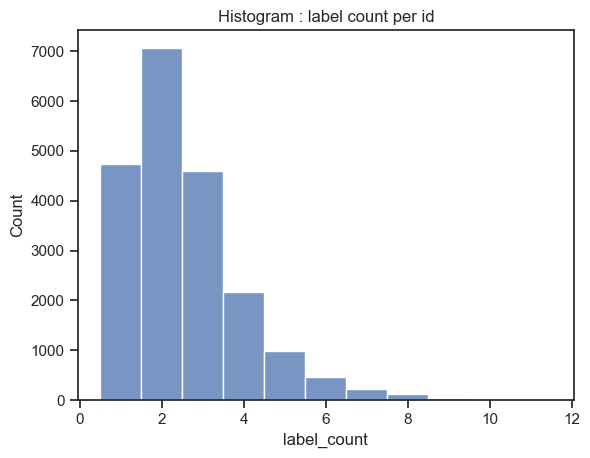

In [52]:
# Using seaborn, create a histogram of the label count of the rows in the DataFrame

# TODO
sns.histplot(df["label_count"],discrete=True).set(title="Histogram : label count per id")

Follow the steps below to create a heatmap showing "correlation" between different labels. 
- Specifically, each cell of the heatmap should correspond to the probability that a sample with the corresponding row label also has the corresponding column label. 
- Just consider the labels ["Piano", "Classical music", "Speech", "Conversation", "Screaming"]. 

Your final plot should look something like this:

![alt text](images/heatmap.png "Heatmap")

<AxesSubplot: >

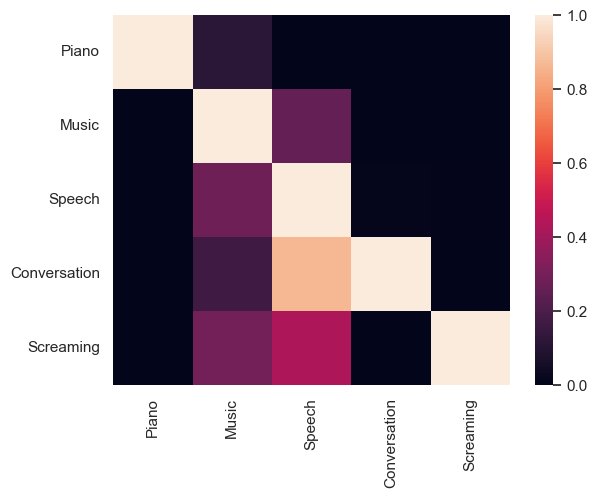

In [57]:
labels = ["Piano", "Music", "Speech", "Conversation", "Screaming"]

# There are a couple ways to approach this, the way we recommend here is to first build a 2D grid where each
# value is the correlation value between the corresponding row/column using the functions created in q1.py.

# TODO
correlation_matrix = np.ones((len(labels), len(labels)))
for i, label_1 in enumerate(labels):
    for j, label_2 in enumerate(labels):
        if i==j:
            continue
        correlation_matrix[i][j] = get_correlation(df["label_names"], label_1, label_2)
        
        
# Then using sns.heatmap, create the heatmap, taking advantage of xticklabels and yticklabels to set the label names
# as tick values

# TODO
sns.heatmap(correlation_matrix,xticklabels=labels, yticklabels=labels)

## Question 2
Question 2 has no notebook component, just fill out the `q2.py` file.

## Question 3

Download the audio for the following labels using the function created in `q3.py`

In [36]:
from q3 import data_pipeline, rename_files, filter_df

In [37]:
# Download "Cough"

# TODO
data_pipeline("data/audio_segments_clean.csv", "Cough")

# Rename to include the start/end times

# TODO
rename_files("Cough_cut", "data/audio_segments_clean.csv")

  0%|                                                                                                                                                           | 0/60 [00:00<?, ?it/s]

[youtube] 0iiwZ2_9Vi8: Downloading webpage
[youtube] 39IZIbmQPzA: Downloading webpage
[youtube] 3Liy9uBgsQM: Downloading webpage
[youtube] --U7joUcTCo: Downloading webpage
[youtube] 5wbc84KnDS0: Downloading webpage
[youtube] 3id3zRRZBVM: Downloading webpage
[youtube] 1Xmw9VUzvLY: Downloading webpage
[youtube] 7lO9BbTaezE: Downloading webpage
[youtube] 9h3a7fN0f-c: Downloading webpage
[youtube] 130v5XJl8G0: Downloading webpage
[youtube] 40fIOkLK3j4: Downloading webpage
[youtube] 0mZQ6Q-viPw: Downloading webpage


ERROR: Private video
Sign in if you've been granted access to this video
ERROR: This video has been removed for violating YouTube's Terms of Service
ERROR: This video has been removed for violating YouTube's Terms of Service


Failed to download ID: 7lO9BbTaezE with exception: ERROR: Private video
Sign in if you've been granted access to this video
Failed to download ID: 130v5XJl8G0 with exception: ERROR: This video has been removed for violating YouTube's Terms of Service
Failed to download ID: 5wbc84KnDS0 with exception: ERROR: This video has been removed for violating YouTube's Terms of Service
[youtube] AIVt3e5EVtc: Downloading webpage
[youtube] BZU01hhyVKs: Downloading webpage
[youtube] AlPu_yxLT2g: Downloading webpage
[youtube] 9h3a7fN0f-c: Refetching age-gated info webpage


ERROR: Private video
Sign in if you've been granted access to this video
ERROR: Sign in to confirm your age
This video may be inappropriate for some users.
ERROR: unable to download video data: HTTP Error 403: Forbidden


Failed to download ID: AIVt3e5EVtc with exception: ERROR: Private video
Sign in if you've been granted access to this video
[download] Destination: Cough_raw\40fIOkLK3j4.mp3
Failed to download ID: 9h3a7fN0f-c with exception: ERROR: Sign in to confirm your age
This video may be inappropriate for some users.
[download] Destination: Cough_raw\1Xmw9VUzvLY.mp3
[download]   0.0% of 2.58MiB at  2.83KiB/s ETA 15:32Failed to download ID: 3Liy9uBgsQM with exception: ERROR: unable to download video data: HTTP Error 403: Forbidden
[download]   0.2% of 4.11MiB at 22.70KiB/s ETA 03:05[download] Destination: Cough_raw\0mZQ6Q-viPw.mp3
[download]   1.2% of 2.58MiB at 48.60KiB/s ETA 00:53[download] Destination: Cough_raw\39IZIbmQPzA.mp3
[download]   0.7% of 4.11MiB at 59.08KiB/s ETA 01:10[youtube] DYTLct-5tVs: Downloading webpage
[download]   6.0% of 513.88KiB at 78.80KiB/s ETA 00:06[youtube] HJg4jZNv1pc: Downloading webpage
[download] Destination: Cough_raw\3id3zRRZBVM.mp3
[download]   0.1% of 2.12MiB 

ERROR: Private video
Sign in if you've been granted access to this video


Failed to download ID: HJg4jZNv1pc with exception: ERROR: Private video
Sign in if you've been granted access to this video
[download]   1.4% of 2.12MiB at 87.41KiB/s ETA 00:24 [youtube] IYllzXfvkmY: Downloading webpage
[download] Destination: Cough_raw\BZU01hhyVKs.mp3
[download]   0.0% of 19.99MiB at 43.37KiB/s ETA 07:51[download] Destination: Cough_raw\0iiwZ2_9Vi8.mp3
[download]   2.9% of 2.12MiB at 73.40KiB/s ETA 00:28 5

ERROR: unable to download video data: HTTP Error 403: Forbidden


Failed to download ID: HMnF8n9c5-Y with exception: ERROR: unable to download video data: HTTP Error 403: Forbidden
[download]   2.6% of 2.37MiB at 56.88KiB/s ETA 00:41[download] Destination: Cough_raw\DYTLct-5tVs.mp3
[download]   1.2% of 4.98MiB at 70.74KiB/s ETA 01:11 7[youtube] IwQFUAPEk70: Downloading webpage
[download]  55.0% of 114.60KiB at 50.97KiB/s ETA 00:01[download] Destination: Cough_raw\IYllzXfvkmY.mp3
[download]   2.1% of 698.02KiB at 104.57KiB/s ETA 00:06

ERROR: Private video
Sign in if you've been granted access to this video


Failed to download ID: IwQFUAPEk70 with exception: ERROR: Private video
Sign in if you've been granted access to this video
[download]  24.7% of 513.88KiB at 72.48KiB/s ETA 00:05[youtube] IzPMbIll3LE: Downloading webpage
[download] 100% of 114.60KiB in 00:02                  
[ffmpeg] Post-process file Cough_raw\--U7joUcTCo.mp3 exists, skipping


  2%|██▍                                                                                                                                                | 1/60 [00:04<04:12,  4.29s/it]

[download]   0.6% of 19.99MiB at 52.79KiB/s ETA 06:25[download] Destination: Cough_raw\IzPMbIll3LE.mp3
[download]   1.0% of 1.46MiB at 105.45KiB/s ETA 00:14[youtube] JKUSKYdYo9w: Downloading webpage
[download]  29.1% of 654.25KiB at 66.94KiB/s ETA 00:06 [download] Destination: Cough_raw\JKUSKYdYo9w.mp3
[download] 100% of 513.88KiB in 00:07                  
[download]  13.1% of 2.58MiB at 44.28KiB/s ETA 00:51[ffmpeg] Correcting container in "Cough_raw\0mZQ6Q-viPw.mp3"
[download]   1.9% of 19.99MiB at 53.51KiB/s ETA 06:15[ffmpeg] Post-process file Cough_raw\0mZQ6Q-viPw.mp3 exists, skipping
[youtube] JLtieDCSa6Y: Downloading webpage
[download]  23.6% of 2.12MiB at 65.90KiB/s ETA 00:25 4[youtube] JLtieDCSa6Y: Downloading MPD manifest
[download]   2.1% of 19.99MiB at 52.76KiB/s ETA 06:193 [download] Destination: Cough_raw\JLtieDCSa6Y.mp3
[download] 100% of 654.25KiB in 00:10                  
[ffmpeg] Post-process file Cough_raw\DYTLct-5tVs.mp3 exists, skipping
[youtube] Kqt4BiLQeeI: Downl

ERROR: unable to download video data: HTTP Error 403: Forbidden


Failed to download ID: PyXQVNaAbHc with exception: ERROR: unable to download video data: HTTP Error 403: Forbidden
[download]  75.0% of 2.37MiB at 52.33KiB/s ETA 00:11[youtube] RFeU64gTvGQ: Downloading webpage
[download]  98.7% of 1.72MiB at 49.35KiB/s ETA 00:001   [download] Destination: Cough_raw\RFeU64gTvGQ.mp3
[download] 100% of 1.72MiB in 00:35                 :00
[download]  13.3% of 4.01MiB at 50.95KiB/s ETA 01:0900 [ffmpeg] Correcting container in "Cough_raw\0iiwZ2_9Vi8.mp3"
[download]  42.9% of 4.11MiB at 49.55KiB/s ETA 00:48[ffmpeg] Post-process file Cough_raw\0iiwZ2_9Vi8.mp3 exists, skipping


  3%|████▉                                                                                                                                              | 2/60 [00:37<20:45, 21.48s/it]

[download]  45.7% of 4.98MiB at 64.87KiB/s ETA 00:42 [youtube] RXJxtAHtkcs: Downloading webpage
[download] 100% of 114.83KiB in 00:01                   
[download]  44.1% of 4.11MiB at 49.60KiB/s ETA 00:47[ffmpeg] Post-process file Cough_raw\RFeU64gTvGQ.mp3 exists, skipping
[download]  61.9% of 2.58MiB at 43.51KiB/s ETA 00:23[download] Destination: Cough_raw\RXJxtAHtkcs.mp3
[download]  89.8% of 1.10MiB at 72.81KiB/s ETA 00:01 9[youtube] Rr84-EZvO0U: Downloading webpage
[download]   7.4% of 847.40KiB at 59.56KiB/s ETA 00:13  [download] Destination: Cough_raw\Rr84-EZvO0U.mp3
[download] 100% of 1.10MiB in 00:15                     
[ffmpeg] Correcting container in "Cough_raw\OSlYn9hTRFA.mp3"
[download]  19.7% of 6.50MiB at 50.93KiB/s ETA 01:44[ffmpeg] Post-process file Cough_raw\OSlYn9hTRFA.mp3 exists, skipping
[download]  68.9% of 1.30MiB at 49.17KiB/s ETA 00:08[youtube] Rtg1SUrxOPY: Downloading webpage
[download]  65.5% of 2.58MiB at 43.49KiB/s ETA 00:2014[youtube] Rtg1SUrxOPY: Download

ERROR: This video has been removed for violating YouTube's policy on nudity or sexual content


Failed to download ID: ThHs0zNnQXg with exception: ERROR: This video has been removed for violating YouTube's policy on nudity or sexual content
[download]   5.4% of 43.90MiB at 49.49KiB/s ETA 14:19   [youtube] TjP-9AlPShg: Downloading webpage
[download]  37.5% of 6.50MiB at 51.15KiB/s ETA 01:2130[download] Destination: Cough_raw\TjP-9AlPShg.mp3
[download] 100% of 969.84KiB in 00:17                   
[download]  31.0% of 1.79MiB at 55.58KiB/s ETA 00:22[ffmpeg] Correcting container in "Cough_raw\TB3VhNczX88.mp3"
[download]  18.6% of 19.99MiB at 53.05KiB/s ETA 05:13[ffmpeg] Post-process file Cough_raw\TB3VhNczX88.mp3 exists, skipping
[download]   6.7% of 43.90MiB at 49.47KiB/s ETA 14:08   [youtube] X8yUSV4oqoU: Downloading webpage
[download]  92.5% of 4.98MiB at 64.88KiB/s ETA 00:05 

ERROR: unable to download video data: HTTP Error 403: Forbidden


Failed to download ID: X8yUSV4oqoU with exception: ERROR: unable to download video data: HTTP Error 403: Forbidden
[youtube] YsUCzO0gfro: Downloading webpage
[download]  19.2% of 19.99MiB at 53.11KiB/s ETA 05:11   [download] Destination: Cough_raw\YsUCzO0gfro.mp3
[download] 100% of 4.98MiB in 01:18                     
[download]  67.2% of 4.01MiB at 51.26KiB/s ETA 00:26[ffmpeg] Correcting container in "Cough_raw\AlPu_yxLT2g.mp3"
[download]  71.3% of 1.96MiB at 45.32KiB/s ETA 00:12    [ffmpeg] Post-process file Cough_raw\AlPu_yxLT2g.mp3 exists, skipping
[download]  68.5% of 4.01MiB at 51.33KiB/s ETA 00:25[youtube] _-_5kbw2Mcw: Downloading webpage
[download] 100% of 1.83MiB in 00:42                  
[download]   7.6% of 43.90MiB at 49.31KiB/s ETA 14:02   [download] Destination: Cough_raw\_-_5kbw2Mcw.mp3
[download]   1.0% of 1.49MiB at 118.82KiB/s ETA 00:12[ffmpeg] Correcting container in "Cough_raw\Rr84-EZvO0U.mp3"
[download] 100% of 2.25MiB in 00:33                  
[ffmpeg] Post-pro

ERROR: Video unavailable
This video is no longer available because the YouTube account associated with this video has been terminated.


Failed to download ID: _prGJ06oCXk with exception: ERROR: Video unavailable
This video is no longer available because the YouTube account associated with this video has been terminated.
[download]  21.0% of 19.99MiB at 53.20KiB/s ETA 05:03

ERROR: This video has been removed for violating YouTube's Terms of Service


[download]   7.6% of 43.90MiB at 49.44KiB/s ETA 13:59   Failed to download ID: aFfXpjfI2nk with exception: ERROR: This video has been removed for violating YouTube's Terms of Service
[download]   4.1% of 1.49MiB at 78.34KiB/s ETA 00:18 [youtube] fIer0uCLqSM: Downloading webpage
[youtube] hQMkT2YEnNA: Downloading webpage
[download]  95.8% of 4.11MiB at 49.28KiB/s ETA 00:03

ERROR: Video unavailable
This video is no longer available because the YouTube account associated with this video has been terminated.


Failed to download ID: hQMkT2YEnNA with exception: ERROR: Video unavailable
This video is no longer available because the YouTube account associated with this video has been terminated.
[youtube] iUtE4nRvBsM: Downloading webpage
[download]  95.9% of 2.29MiB at 53.69KiB/s ETA 00:01[youtube] fIer0uCLqSM: Downloading MPD manifest
[download]  21.3% of 19.99MiB at 53.11KiB/s ETA 05:03[download] Destination: Cough_raw\fIer0uCLqSM.mp3
[download]   7.8% of 43.90MiB at 49.43KiB/s ETA 13:58   [download] Destination: Cough_raw\iUtE4nRvBsM.mp3
[download] 100% of 2.29MiB in 00:43                 26 
[download]   7.9% of 43.90MiB at 49.43KiB/s ETA 13:57   [ffmpeg] Correcting container in "Cough_raw\Rtg1SUrxOPY.mp3"
[download]  54.7% of 6.50MiB at 51.28KiB/s ETA 00:58[ffmpeg] Post-process file Cough_raw\Rtg1SUrxOPY.mp3 exists, skipping
[youtube] j6gaw7Nasnc: Downloading webpage
[download]  18.4% of 1.49MiB at 75.00KiB/s ETA 00:16 6 

ERROR: Private video
Sign in if you've been granted access to this video


Failed to download ID: j6gaw7Nasnc with exception: ERROR: Private video
Sign in if you've been granted access to this video
[download]  68.4% of 1.79MiB at 55.39KiB/s ETA 00:10[youtube] kL_-XdzJQ3g: Downloading webpage
[download]   8.0% of 43.90MiB at 49.47KiB/s ETA 13:55   

ERROR: Video unavailable
This video is no longer available because the YouTube account associated with this video has been terminated.


Failed to download ID: kL_-XdzJQ3g with exception: ERROR: Video unavailable
This video is no longer available because the YouTube account associated with this video has been terminated.
[youtube] kOheqjodDmw: Downloading webpage
[download] 100% of 4.11MiB in 01:25                 
[ffmpeg] Correcting container in "Cough_raw\1Xmw9VUzvLY.mp3"
[download]  83.7% of 1.96MiB at 45.08KiB/s ETA 00:0705 [ffmpeg] Post-process file Cough_raw\1Xmw9VUzvLY.mp3 exists, skipping


  8%|████████████▎                                                                                                                                      | 5/60 [01:27<16:27, 17.95s/it]

[download]  56.2% of 6.50MiB at 51.35KiB/s ETA 00:56[download] Destination: Cough_raw\kOheqjodDmw.mp3
[download]   3.3% of 3.74MiB at  1.99MiB/s ETA 00:01 [youtube] khC7ed0_Kvs: Downloading webpage
[download] 100% of 3.74MiB in 00:00                  


ERROR: Video unavailable


Failed to download ID: khC7ed0_Kvs with exception: ERROR: Video unavailable
[download]  85.7% of 1.96MiB at 45.23KiB/s ETA 00:06[ffmpeg] Post-process file Cough_raw\kOheqjodDmw.mp3 exists, skipping
[youtube] lH6ym1UrlnE: Downloading webpage
[download]  39.3% of 2.04MiB at 68.00KiB/s ETA 00:18 [youtube] mQITX62D_3s: Downloading webpage
[download]   8.2% of 43.90MiB at 49.42KiB/s ETA 13:54   

ERROR: Video unavailable


Failed to download ID: mQITX62D_3s with exception: ERROR: Video unavailable
[download]   9.2% of 1.99MiB at 45.53KiB/s ETA 00:40[youtube] nBuw_KZXT_k: Downloading webpage
[download]  58.1% of 511.25KiB at 61.88KiB/s ETA 00:03 [download] Destination: Cough_raw\lH6ym1UrlnE.mp3
[download]  42.3% of 2.04MiB at 67.92KiB/s ETA 00:17 [download] Destination: Cough_raw\nBuw_KZXT_k.mp3
[download] 100% of 511.25KiB in 00:08                   
[download]  48.7% of 1.49MiB at 74.40KiB/s ETA 00:10 [ffmpeg] Correcting container in "Cough_raw\fIer0uCLqSM.mp3"
[download]   8.7% of 43.90MiB at 49.40KiB/s ETA 13:50   [ffmpeg] Post-process file Cough_raw\fIer0uCLqSM.mp3 exists, skipping
[youtube] nK04u0NuenA: Downloading webpage
[download]  18.9% of 1.99MiB at 44.43KiB/s ETA 00:3701 

ERROR: This video has been removed for violating YouTube's Community Guidelines


Failed to download ID: nK04u0NuenA with exception: ERROR: This video has been removed for violating YouTube's Community Guidelines
[download]  11.0% of 1.59MiB at 42.31KiB/s ETA 00:34 [youtube] pzsV0Sr5hrE: Downloading webpage
[download]  23.7% of 19.99MiB at 53.13KiB/s ETA 04:53   [youtube] pzsV0Sr5hrE: Downloading MPD manifest
[download] 100% of 349.18KiB in 00:04                  
[download]  83.5% of 4.01MiB at 51.22KiB/s ETA 00:13[ffmpeg] Correcting container in "Cough_raw\nBuw_KZXT_k.mp3"
[download]  58.9% of 2.04MiB at 68.65KiB/s ETA 00:12 [ffmpeg] Post-process file Cough_raw\nBuw_KZXT_k.mp3 exists, skipping
[download] 100% of 1.96MiB in 00:44                 
[youtube] vIBtwK5mH5Q: Downloading webpage
[ffmpeg] Correcting container in "Cough_raw\TA-iHSeEUYk.mp3"
[download]  93.7% of 1.79MiB at 55.48KiB/s ETA 00:02 [download] Destination: Cough_raw\pzsV0Sr5hrE.mp3
[download]   1.8% of 382.56KiB at 37.35KiB/s ETA 00:10

ERROR: This video has been removed for violating YouTube's Community Guidelines


[download]   3.9% of 382.56KiB at 75.12KiB/s ETA 00:04Failed to download ID: vIBtwK5mH5Q with exception: ERROR: This video has been removed for violating YouTube's Community Guidelines
[download]  84.8% of 4.01MiB at 51.30KiB/s ETA 00:12[youtube] w4enmhllLkQ: Downloading webpage
[download]   8.9% of 43.90MiB at 49.32KiB/s ETA 13:50   [ffmpeg] Post-process file Cough_raw\TA-iHSeEUYk.mp3 exists, skipping
[download]  16.5% of 1.59MiB at 44.31KiB/s ETA 00:30[youtube] wU1xLUAWAyA: Downloading webpage
[download]   8.1% of 382.56KiB at 62.31KiB/s ETA 00:05

ERROR: This video has been removed for violating YouTube's Terms of Service


Failed to download ID: w4enmhllLkQ with exception: ERROR: This video has been removed for violating YouTube's Terms of Service
[youtube] wuvn-vp5InE: Downloading webpage
[download]  62.4% of 2.04MiB at 68.34KiB/s ETA 00:11 

ERROR: Video unavailable
This video is no longer available because the YouTube account associated with this video has been terminated.


Failed to download ID: wU1xLUAWAyA with exception: ERROR: Video unavailable
[download]  61.9% of 6.50MiB at 51.23KiB/s ETA 00:49e account associated with this video has been terminated.
[youtube] yMNs4gCJn1c: Downloading webpage
[download]  25.6% of 1.99MiB at 45.33KiB/s ETA 00:3305  [download] Destination: Cough_raw\wuvn-vp5InE.mp3
[download] 100% of 168.17KiB in 00:00                   
[download]  86.2% of 4.01MiB at 51.20KiB/s ETA 00:11[ffmpeg] Correcting container in "Cough_raw\wuvn-vp5InE.mp3"
[download]  62.7% of 6.50MiB at 51.29KiB/s ETA 00:48 [download] Destination: Cough_raw\yMNs4gCJn1c.mp3
[download]   2.7% of 558.09KiB at 110.49KiB/s ETA 00:04[ffmpeg] Post-process file Cough_raw\wuvn-vp5InE.mp3 exists, skipping
[download] 100% of 1.79MiB in 00:32                 0
[ffmpeg] Post-process file Cough_raw\TjP-9AlPShg.mp3 exists, skipping
[download] 100% of 382.56KiB in 00:07                   
[ffmpeg] Post-process file Cough_raw\pzsV0Sr5hrE.mp3 exists, skipping
[download] 100% 

 25%|████████████████████████████████████▌                                                                                                             | 15/60 [06:26<20:23, 27.19s/it]

[download] 100% of 43.90MiB in 15:09                    
[ffmpeg] Correcting container in "Cough_raw\Kqt4BiLQeeI.mp3"
[ffmpeg] Post-process file Cough_raw\Kqt4BiLQeeI.mp3 exists, skipping


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:02<00:00, 27.72it/s]


In [69]:
# Download "Hammer"

# TODO
data_pipeline("data/audio_segments_clean.csv", "Hammer")

# Rename to include the start/end times

# TODO
rename_files("Hammer_cut", "data/audio_segments_clean.csv")

  0%|                                                                                                                                                           | 0/60 [00:00<?, ?it/s]

[youtube] 19knOj43yZE: Downloading webpage
[youtube] 4mHLCOzd2No: Downloading webpage
[youtube] --BfvyPmVMo: Downloading webpage
[youtube] 5etqUVLDcE4: Downloading webpage
[youtube] 1wdCX1HmRyk: Downloading webpage
[youtube] 3CnwUQZ6q78: Downloading webpage
[youtube] 03aJ_RcnBko: Downloading webpage
[youtube] 0fsntL6RKww: Downloading webpage
[youtube] 0GNNFBrRz1E: Downloading webpage
[youtube] 2pYtX-Stpys: Downloading webpage
[youtube] 07AQUF6A_mg: Downloading webpage
[youtube] 402OOck5CAk: Downloading webpage
[download] Destination: Hammer_raw\19knOj43yZE.mp3
[download] Destination: Hammer_raw\4mHLCOzd2No.mp3
[download] Destination: Hammer_raw\0fsntL6RKww.mp3
[download]   0.1% of 23.24MiB at 18.34KiB/s ETA 21:36   [youtube] 2pYtX-Stpys: Downloading MPD manifest
[download]   0.2% of 23.24MiB at 53.04KiB/s ETA 07:27   [download] Destination: Hammer_raw\07AQUF6A_mg.mp3
[download]   0.0% of 5.61MiB at 1004.49B/s ETA 01:37:31[download] Destination: Hammer_raw\3CnwUQZ6q78.mp3
[download] Des

  2%|██▍                                                                                                                                                | 1/60 [00:37<36:49, 37.45s/it]

[download]  21.7% of 7.24MiB at 45.04KiB/s ETA 02:08   [youtube] 6GLRCkbptwQ: Downloading webpage
[download]  52.3% of 4.65MiB at 68.36KiB/s ETA 00:339   [download] Destination: Hammer_raw\660s2w9DSgc.mp3
[download]  30.4% of 7.12MiB at 62.42KiB/s ETA 01:21   [download] Destination: Hammer_raw\6GLRCkbptwQ.mp3
[download] 100% of 3.07MiB in 00:50                     
[download]  30.4% of 7.24MiB at 45.19KiB/s ETA 01:54   [ffmpeg] Post-process file Hammer_raw\0fsntL6RKww.mp3 exists, skipping
[download]  36.6% of 7.41MiB at 55.60KiB/s ETA 01:26   [youtube] 6gchJ1prCFM: Downloading webpage
[download]  42.9% of 7.12MiB at 62.38KiB/s ETA 01:06    [download] Destination: Hammer_raw\6gchJ1prCFM.mp3
[download] 100% of 1.08MiB in 00:17                     
[download]  96.2% of 2.46MiB at 45.20KiB/s ETA 00:02[ffmpeg] Post-process file Hammer_raw\6GLRCkbptwQ.mp3 exists, skipping
[youtube] AAySJVt6bys: Downloading webpage
[download]  76.5% of 5.61MiB at 80.61KiB/s ETA 00:16    [download] Destination

  3%|████▊                                                                                                                                           | 2/60 [06:09<3:23:37, 210.65s/it]

[youtube] hvHiJQL7_9s: Downloading webpage
[ffmpeg] Post-process file Hammer_raw\19knOj43yZE.mp3 exists, skipping
[download]   7.7% of 7.74MiB at 49.08KiB/s ETA 02:28[youtube] iQnzlK9YsL8: Downloading webpage
[download]  77.6% of 11.28MiB at 45.14KiB/s ETA 00:57

ERROR: Video unavailable


Failed to download ID: hvHiJQL7_9s with exception: ERROR: Video unavailable
[youtube] ijgwCwnKZUM: Downloading webpage
[download]  61.3% of 11.63MiB at 46.46KiB/s ETA 01:39

ERROR: Private video
Sign in if you've been granted access to this video


Failed to download ID: ijgwCwnKZUM with exception: ERROR: Private video
Sign in if you've been granted access to this video
[youtube] jlGuL8s4y0k: Downloading webpage
[download]  98.1% of 12.69MiB at 63.13KiB/s ETA 00:03         [youtube] jlGuL8s4y0k: Downloading MPD manifest
[download] Destination: Hammer_raw\iQnzlK9YsL8.mp3
[download]  94.5% of 15.81MiB at 80.52KiB/s ETA 00:10         [download] Destination: Hammer_raw\jlGuL8s4y0k.mp3
[download] 100% of 12.69MiB in 03:25                          
[ffmpeg] Correcting container in "Hammer_raw\Ik7GbPEqljg.mp3"
[download] 100% of 159.54KiB in 00:03                 
[ffmpeg] Correcting container in "Hammer_raw\jlGuL8s4y0k.mp3"
[download]   2.5% of 8.33MiB at 50.24KiB/s ETA 02:452[ffmpeg] Post-process file Hammer_raw\jlGuL8s4y0k.mp3 exists, skipping
[youtube] oMk8RceCCu4: Downloading webpage
[download]  49.9% of 3.10MiB at 62.86KiB/s ETA 00:25 [ffmpeg] Post-process file Hammer_raw\Ik7GbPEqljg.mp3 exists, skipping
[download]  84.0% of 3.86M

ERROR: unable to download video data: HTTP Error 403: Forbidden


Failed to download ID: tfMC-N8vX54 with exception: ERROR: unable to download video data: HTTP Error 403: Forbidden
[download]  65.2% of 5.85MiB at 75.04KiB/s ETA 00:27 [youtube] tz0avWZoqjg: Downloading webpage
[download]  24.5% of 11.66MiB at 64.65KiB/s ETA 02:19         [download] Destination: Hammer_raw\tz0avWZoqjg.mp3
[download] 100% of 9.12MiB in 03:40                 4         
[ffmpeg] Correcting container in "Hammer_raw\ShcyfLSHa1Y.mp3"
[download]  12.8% of 3.00MiB at 69.63KiB/s ETA 00:38          [ffmpeg] Post-process file Hammer_raw\ShcyfLSHa1Y.mp3 exists, skipping
[download]  44.1% of 37.31MiB at 53.26KiB/s ETA 06:40         [youtube] uYipfjHCJm8: Downloading webpage
[download]  17.8% of 4.14MiB at 51.75KiB/s ETA 01:07  [download] Destination: Hammer_raw\uYipfjHCJm8.mp3
[download] 100% of 11.24MiB in 03:04                          
[download]  45.4% of 37.31MiB at 53.22KiB/s ETA 06:31         [ffmpeg] Correcting container in "Hammer_raw\ZG89HVoA1Zg.mp3"
[download]  45.7% of 

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:07<00:00,  8.26it/s]


As you've probably noticed, downloading all this audio data is slow (and as such we only required you to download 2 of the labels). In many cases, it is possible to get significant performance increases by using either multiprocessing (https://docs.python.org/3/library/multiprocessing.html) or multithreading (https://docs.python.org/3/library/threading.html) which could for example allow you to download multiple audio files in parallel. 

As a good rule of thumb, use multithreading when your programs is IO-bound (for example here) and multiprocessing when it is CPU-bound (and thus make use of all the cores of your CPU)

## Question 4
For the following cells, use the ID "0GNNFBrRz1E". Complete the functions and run the cells provided below.

In [73]:
import librosa

In [68]:
# Play the audio segment in Jupyter using 
# https://ipython.org/ipython-doc/dev/api/generated/IPython.display.html#IPython.display.Audio

# TODO
from IPython.display import Audio
from q2 import download_audio
yt_id = "0GNNFBrRz1E"
download_audio(yt_id, f"{yt_id}.mp3")
display(Audio(filename=f"{yt_id}.mp3"))

[youtube] 0GNNFBrRz1E: Downloading webpage
[download] Destination: 0GNNFBrRz1E.mp3
[download] 100% of 7.24MiB in 02:44                 
[ffmpeg] Correcting container in "0GNNFBrRz1E.mp3"
[ffmpeg] Post-process file 0GNNFBrRz1E.mp3 exists, skipping


One way to visualize audio is through the use of mel-spectrograms. At a very high level, Mel-spectrograms convert audio to a 2D image through the use of the Fourier transform (more details can be found here: https://medium.com/analytics-vidhya/understanding-the-mel-spectrogram-fca2afa2ce53)

In [117]:
stft_hopsize = 128
n_fft = 512
sample_rate = 16000

def to_log_scale(mel: np.ndarray) -> np.ndarray:
    mel = np.log(mel + 1e-6)/2.0
    return mel

def create_mel_spectrogram(mp3_path: str) -> np.ndarray:
    """ 
    Using librosa (https://librosa.org/doc/main/generated/librosa.feature.melspectrogram.html) write a function
    that:
    1. Loads in audio from a mp3_path (using librosa)
    2. Converts it to a mel-spectrogram (using the parameters provided above)
    3. Applies the logscale transformation to the mel-spectrogram (provided above once again)
    4. Returns the transformed mel-spectrogram
    
    Make sure to pass the correct sample rate
    """

    # TODO
    audio, sr = librosa.load(mp3_path, sr=sample_rate)
    mel_spect = librosa.feature.melspectrogram(y=audio, sr=sr, n_fft=n_fft, hop_length=stft_hopsize)
    scaled_mel_spect = to_log_scale(mel_spect)
    return audio, scaled_mel_spect
    

create_mel_spectrogram("Hammer_cut/0GNNFBrRz1E_40_50_10.mp3")

(array([ 0.00839577,  0.00800792,  0.00238198, ..., -0.00395144,
        -0.00091389,  0.00020127], dtype=float32),
 array([[-1.928729 , -1.5724844, -1.4665293, ..., -3.0154183, -2.2699113,
         -2.5421927],
        [-2.066132 , -1.7496233, -1.7105331, ..., -2.8002958, -2.169026 ,
         -2.507069 ],
        [-2.2558918, -2.0301414, -2.224279 , ..., -2.639673 , -2.0759053,
         -2.4663372],
        ...,
        [-6.7042766, -6.8283896, -6.888109 , ..., -6.877149 , -6.876764 ,
         -6.8927326],
        [-6.8572235, -6.893735 , -6.9052205, ..., -6.9054623, -6.9039235,
         -6.905158 ],
        [-6.88361  , -6.902533 , -6.9077363, ..., -6.9077435, -6.907744 ,
         -6.9077353]], dtype=float32))

Audio data can also be visualized by looking at the waveform (i.e. as a line plot of the amplitude values). We will combine both visualizations methods below. The resulting plot should look something like:
![alt text](images/combined_plot.png "Combined Plot")

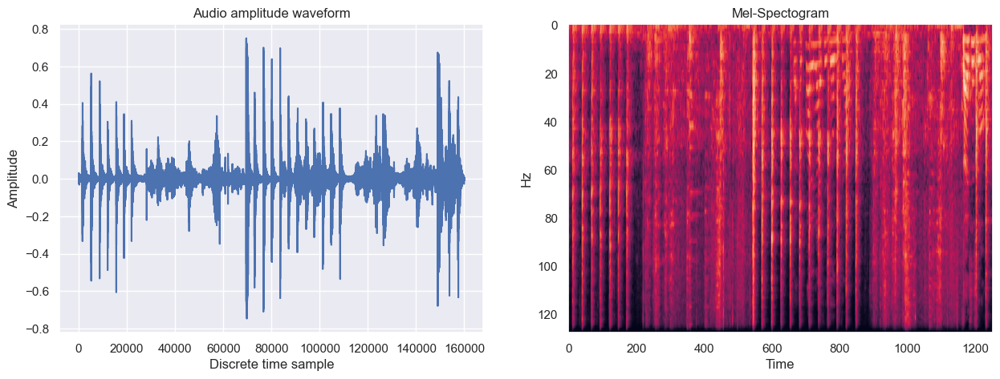

In [138]:
def plot_audio(mp3_path: str) -> None:
    """ 
    Using matplotlib and create_mel_spectrogram() write a function that takes a mp3_path and plots
    both the waveform (line plot of amplitudes) and the mel-spectrogram side-by-side as subplots.
    
    Use the path as a single main title for both subplots
    """

    # TODO
#     plt.title("Audio amplitude waveform")
#     plt.plot(np.arange(0, len(audio), 1), audio)
    audio_timeseries, mel_spectogram = create_mel_spectrogram(mp3_path)
    fig, ax = plt.subplots(1, 2, figsize=(15,5))
    ax[0].plot(np.arange(0, len(audio_timeseries), 1), audio_timeseries)
    ax[0].set_xlabel("Discrete time sample")
    ax[0].set_ylabel("Amplitude")
    ax[0].set_title("Audio amplitude waveform")
    
    ax[1].imshow(mel_spectogram,aspect="auto")
    ax[1].set_xticks(np.arange(0, mel_spectogram.shape[1], 200))
    ax[1].set_yticks(np.arange(0, mel_spectogram.shape[0], 20))
    ax[1].grid(visible=False)
    ax[1].set_xlabel("Time")
    ax[1].set_ylabel("Hz")
    ax[1].set_title("Mel-Spectogram")

    
plot_audio("Hammer_cut/0GNNFBrRz1E_40_50_10.mp3")